# Capstone Project - The Battle of the Neighborhoods
### Applied Data Science Capstone by IBM/Coursera
#### Authored By: Ifeoluwa Anjorin

## Table of contents
* [Introduction: Buisness Problem](#introduction)
* [Data](#data)
* [Methodology](#methodology)
* [Analysis](#analysis)
* [Results and Discussion](#results)
* [Conclusion](#conclusion)



## Introduction: Business Problem <a name="introduction"></a>

When you choose to live in New York, NY, you are choosing a lot more than a place to call home. You are choosing a lifestyle, defined by a city teeming with possibilities.   

Encompassing 8.4 million residents spread throughout five boroughs, New York’s intersecting cultures and communities have established the city as a global destination for arts and culture, commerce and cuisine, and everything in between.

Hence, if anyone is considering moving to a new area of the city, it does not matter whether they are making the switch from Manhattan or the Midwest — people are likely to be following the same basic checklist.   

After the standard affordability factor, people also ask; where are the  safest areas in NYC? Does this potential new neighborhood have relatively easy access to the subway? Access to good restaurants and bars? Do I feel comfortable walking there alone at night?    

Cost, convenience, neighborhood amenities and security are only some of the factors that renters and buyers consider in selecting a home, and it is not likely that any one factor would be decisive.    

While safety statistics are probably not the only factor a prospective renter or buyer should consider in choosing a home, safety data is one type of information that may help to evaluate housing choices.



## Data <a name="Data"></a>

The Data is a List of every arrest in NYC in 2017. This data is manually extracted every quarter and reviewed by the Office of Management Analysis and Planning before being posted on the NYPD website. Each record represents an arrest effected in NYC by the NYPD and includes information about the type of crime, the location and time of enforcement. 


The data can be found here https://data.cityofnewyork.us/Public-Safety/NYPD-Arrests-Data-Historic-/8h9b-rp9u

## Analysis <a name="Analysis"></a>

<b>Import all needed Libraries</b>

In [118]:
import pandas as pd
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import requests # library to handle requests
from bs4 import BeautifulSoup as bs
import datetime as dt
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.style.use('ggplot') # optional: for ggplot-like style
%matplotlib inline
import pickle
import pandas_profiling

<b>Load in the Crime dataset for 2017 as data2017</b>

In [119]:
#data2017 = pickle.load(open('data2017', 'rb'))
data2017 = pd.read_excel('data2017.xlsx')

<b>Preview of the Dataset</b>

In [135]:
data2017.head()

,ARREST_KEY,ARREST_DATE,PD_CD,PD_DESC,KY_CD,OFNS_DESC,LAW_CODE,LAW_CAT_CD,ARREST_BORO,ARREST_PRECINCT,JURISDICTION_CODE,AGE_GROUP,PERP_SEX,PERP_RACE,X_COORD_CD,Y_COORD_CD,Latitude,Longitude,Weekday,DayType,Year,Month,MonthName,Number_of_Arrest,Neighborhood
0,173114463,2017-12-31,478,"THEFT OF SERVICES, UNCLASSIFIED",343,OTHER OFFENSES RELATED TO THEFT,PL 1651503,M,Q,114,0,25-44,M,ASIAN / PACIFIC ISLANDER,1009113,219613,40.769437,-73.910241,Sunday,Weekend,2017,12,NaN,1,Astoria
1,173113513,2017-12-31,849,"NY STATE LAWS,UNCLASSIFIED VIOLATION",677,OTHER STATE LAWS,LOC000000V,V,K,73,1,18-24,M,BLACK,1010719,186857,40.679525,-73.904572,Sunday,Weekend,2017,12,NaN,1,Broadway Junction
2,173113421,2017-12-31,101,ASSAULT 3,344,ASSAULT 3 & RELATED OFFENSES,PL 1200001,M,M,18,0,45-64,M,BLACK,987073,216078,40.759768,-73.989811,Sunday,Weekend,2017,12,NaN,1,Midtown
3,173128438,2017-12-31,511,"CONTROLLED SUBSTANCE, POSSESSION 7",235,DANGEROUS DRUGS,PL 2200300,M,M,25,0,25-44,M,BLACK,999724,230625,40.799683,-73.944112,Sunday,Weekend,2017,12,NaN,1,East Harlem
4,173128428,2017-12-31,339,"LARCENY,PETIT FROM OPEN AREAS,UNCLASSIFIED",341,PETIT LARCENY,PL 1552500,M,K,61,0,65+,F,WHITE,997477,154359,40.590354,-73.952377,Sunday,Weekend,2017,12,NaN,1,Homecrest


To get an idea of the data size

In [121]:
data2017.shape

(134832, 25)

In [122]:
data2017.profile_report()

### DATA ATTRIBUTE NAMES & DESCRIPTION  
<b>ARREST_KEY</b>	Randomly generated persistent ID for each arrest   
<b>ARREST_DATE</b>	Exact date of arrest for the reported event   
<b>PD_CD</b>	Three digit internal classification code (more granular than Key Code)   
<b>PD_DESC</b>	Description of internal classification corresponding with PD code (more granular than Offense Description)  
<b>KY_CD</b>	Three digit internal classification code (more general category than PD code)  
<b>OFNS_DESC</b>	Description of internal classification corresponding with KY code (more general category than PD description)  
<b>LAW_CODE</b>	Law code charges corresponding to the NYS Penal Law, VTL and other various local laws   
<b>LAW_CAT_CD</b>	Level of offense: felony, misdemeanor, violation    
<b>ARREST_BORO</b>	Borough of arrest. B(Bronx), S(Staten Island), K(Brooklyn), M(Manhattan), Q(Queens)    
<b>ARREST_PRECINCT</b>	Precinct where the arrest occurred    
<b>JURISDICTION_CODE</b>	Jurisdiction responsible for arrest. Jurisdiction codes 0(Patrol), 1(Transit) and 2(Housing) represent NYPD whilst codes 3 and more represent non NYPD jurisdictions    
<b>AGE_GROUP</b>	Perpetrator’s age within a category    
<b>PERP_SEX</b>	Perpetrator’s sex description   
<b>PERP_RACE</b>	Perpetrator’s race description     
<b>X_COORD_CD</b>	Midblock X-coordinate for New York State Plane Coordinate System, Long Island Zone, NAD 83, units feet (FIPS 3104)   
<b>Y_COORD_CD</b>	Midblock Y-coordinate for New York State Plane Coordinate System, Long Island Zone, NAD 83, units feet (FIPS 3104)    
<b>Latitude</b>	Latitude coordinate for Global Coordinate System, WGS 1984, decimal degrees (EPSG 4326)      
<b>Longitude</b>	Longitude coordinate for Global Coordinate System, WGS 1984, decimal degrees (EPSG 4326)    


## Exploratory Analysis of the data

<b>Get the list of all Categorical variables in the data set</b>

In [123]:
### Categorical variables

cat_vars = [var for var in data2017.columns if data2017[var].dtypes=='O']

print('Number of categorical variables: ', len(cat_vars))

Number of categorical variables:  11


In [124]:
for var in cat_vars:
    print(var, len(data2017[var].unique()), ' categories')

PD_DESC 265  categories
OFNS_DESC 65  categories
LAW_CODE 936  categories
LAW_CAT_CD 4  categories
ARREST_BORO 5  categories
AGE_GROUP 5  categories
PERP_SEX 2  categories
PERP_RACE 7  categories
Weekday 7  categories
DayType 2  categories
Neighborhood 288  categories


In [125]:
#TO SEE ALL UNIQUE BOROUGH AND GENDER PRESENT IN THE DATA 

In [126]:
Borough = data2017.ARREST_BORO.unique().tolist()
Borough

['Q', 'K', 'M', 'B', 'S']

In [131]:
Sex = data2017.PERP_SEX.unique().tolist()
Sex

['M', 'F']

<b>We write a function to plot the categorical variables againts the number of arrests</b>

In [136]:
def analyse_discrete(df, var):
    df = df.copy()
    pd.DataFrame(df.groupby(var)['Number_of_Arrest'].sum()).sort_values(by='Number_of_Arrest').plot.bar(figsize=(10, 9))
    plt.title(var)
    plt.ylabel('Arrests')
    plt.show()

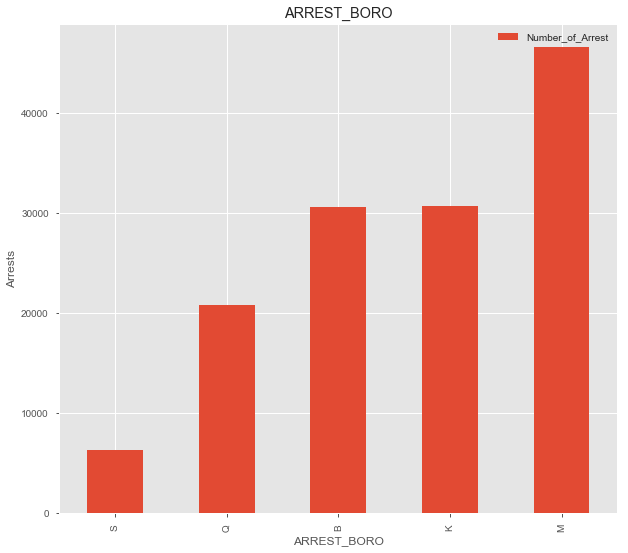

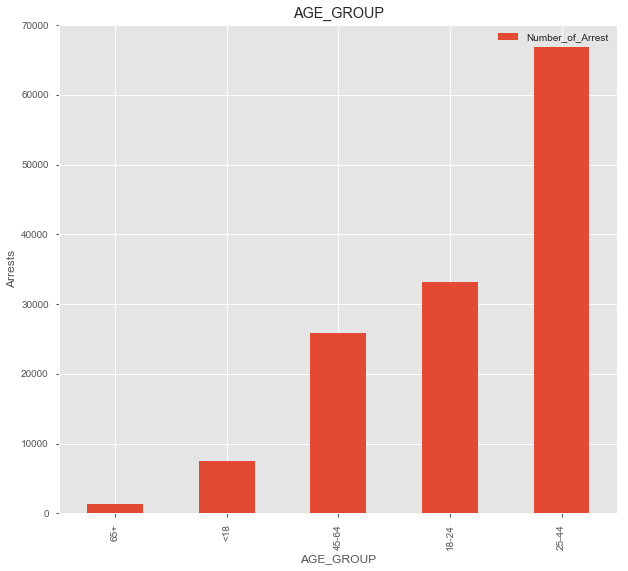

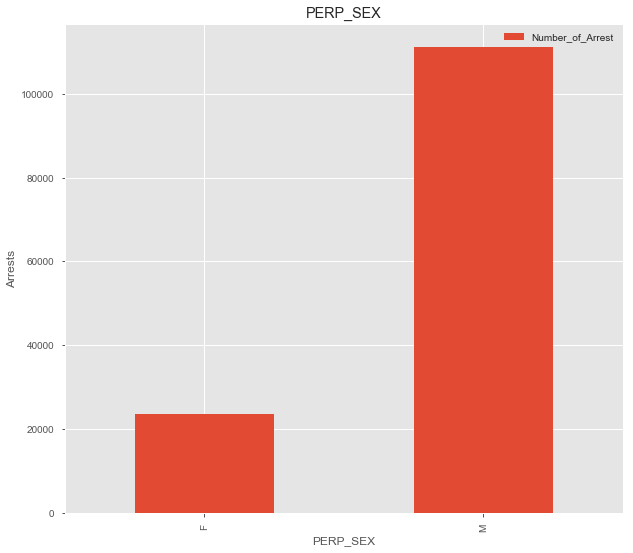

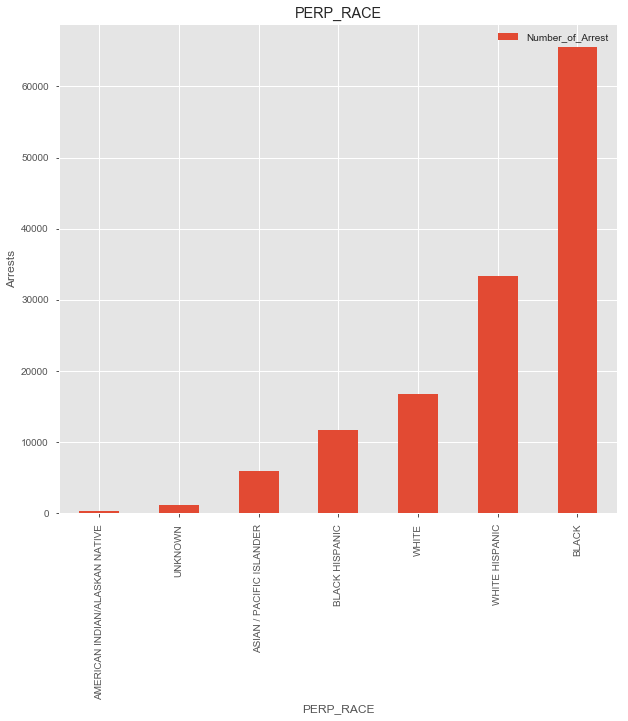

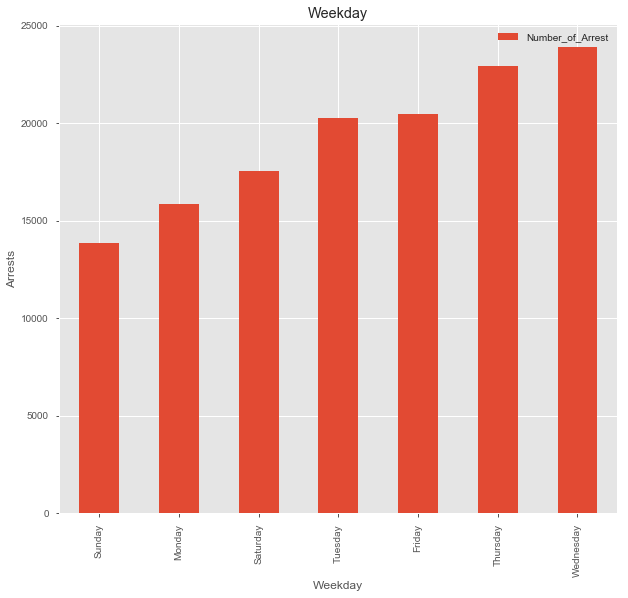

In [137]:
for var  in cat_vars:
    if var in ['ARREST_BORO', 'AGE_GROUP', 'Weekday', 'Daytype', 'PERP_SEX', 'PERP_RACE']:
        analyse_discrete(data2017, var)

<b>See how Crime rate changed over the entire period between Jan 2017 - Dec 2017 for each borough</b>

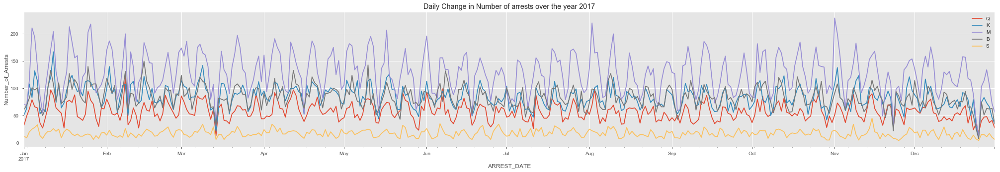

In [139]:
for var in Borough:
    msk = data2017['ARREST_BORO'] == var
    data2017[msk].groupby('ARREST_DATE')['Number_of_Arrest'].sum().plot(figsize=(35, 5))
    plt.ylabel('Number_of_Arrests')
    plt.title('Daily Change in Number of arrests over the year 2017')
    plt.legend(Borough, loc=1)

<b>Lets plot a monthly view of crime for each Borough</b>

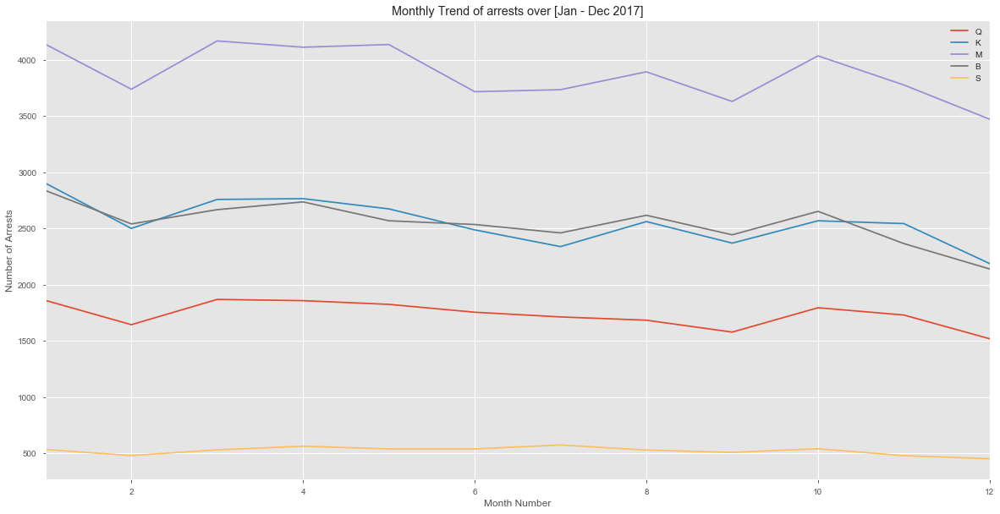

In [140]:
for var in Borough:
    msk = data2017['ARREST_BORO'] == var
    data2017[msk].groupby('Month')['Number_of_Arrest'].sum().plot(figsize=(20, 10))
    plt.ylabel('Number of Arrests')
    plt.xlabel('Month Number')
    #plt.xticks(range(12),['Jan','Feb'.'Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec'])
    plt.title('Monthly Trend of arrests over [Jan - Dec 2017]')
    plt.legend(Borough, loc=1)

The trend shows a decrease in crime rate near the end of the Year for all Boroughs

<b>Plotting the daily crime trend for all boroughs combined</b>

Text(0.5, 1.0, 'Daily Trendr of arrests - New York 2017')

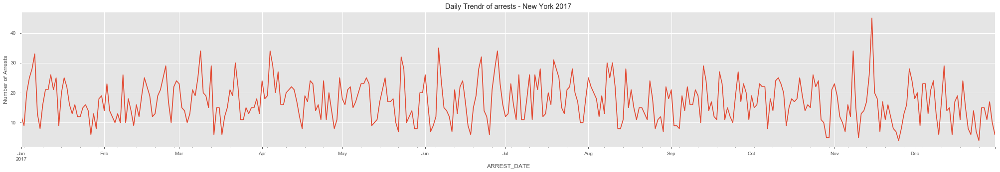

In [142]:
data2017[msk].groupby('ARREST_DATE')['Number_of_Arrest'].sum().plot(figsize=(35, 5))
plt.ylabel('Number of Arrests')
plt.title('Daily Trendr of arrests - New York 2017')

<b>Plotting the Monthly Crime trend for all borough combined</b>

Text(0.5, 1.0, 'Monthly Trend of arrests - New York 2017')

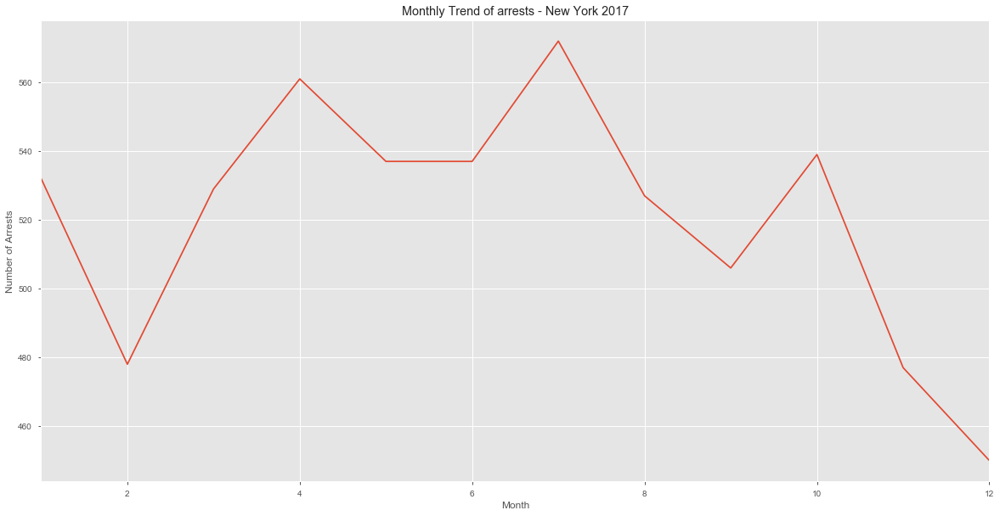

In [145]:
data2017[msk].groupby('Month')['Number_of_Arrest'].sum().plot(figsize=(20, 10))
plt.ylabel('Number of Arrests')
plt.title('Monthly Trend of arrests - New York 2017')

<b>Here, we explore the different crime categories</b>

In [146]:
def analyse_discrete1(df, var):# funtion to group number of arrests by frequency of occurrence
    df = df.copy()
    return pd.DataFrame(df.groupby(var)['Number_of_Arrest'].sum()).sort_values(by = ['Number_of_Arrest'], ascending = False).reset_index()
for var in cat_vars:
    a = analyse_discrete1(data2017, var)

In [147]:
Crime_pd_desc = analyse_discrete1(data2017, 'PD_DESC')
Crime_pd_desc.head()

,PD_DESC,Number_of_Arrest
0,ASSAULT 3,12119
1,"LARCENY,PETIT FROM OPEN AREAS,UNCLASSIFIED",11954
2,"THEFT OF SERVICES, UNCLASSIFIED",11609
3,"MARIJUANA, POSSESSION 4 & 5",8353
4,"TRAFFIC,UNCLASSIFIED MISDEMEAN",7612


Here we see Assault 3, Larceny and Theft are the top crimes by number of occurrence at New York

<b>We can then take this further to see what the top 5 Crimes are across all the Boroughs in New York</b>

In [148]:
crmgrp = pd.DataFrame(data2017.groupby(['ARREST_BORO', 'PD_DESC'])['Number_of_Arrest']\
                      .sum()).sort_values(by = ['ARREST_BORO'], ascending = True).reset_index()
cg = (crmgrp.groupby(['ARREST_BORO']).apply(lambda x:x.sort_values(['Number_of_Arrest'], ascending = False))\
      .reset_index(drop=True)).groupby('ARREST_BORO').head(5).reset_index(drop=True)
cg

,ARREST_BORO,PD_DESC,Number_of_Arrest
0,B,ASSAULT 3,3612
1,B,"MARIJUANA, POSSESSION 4 & 5",2426
2,B,"LARCENY,PETIT FROM OPEN AREAS,UNCLASSIFIED",2265
3,B,"TRAFFIC,UNCLASSIFIED MISDEMEAN",2204
4,B,"ASSAULT 2,1,UNCLASSIFIED",1548
5,K,"THEFT OF SERVICES, UNCLASSIFIED",2702
6,K,ASSAULT 3,2484
7,K,"LARCENY,PETIT FROM OPEN AREAS,UNCLASSIFIED",2171
8,K,"MARIJUANA, POSSESSION 4 & 5",1774
9,K,"CONTROLLED SUBSTANCE, POSSESSION 7",1500


From the above analysis, Assault consistently occurs as part of the top 5 crimes across all five Boroughs coming up as the leading crime in Bronx, Queens and Staten Highland

<b>Let's Explore the top 20 Neighbourhoods with highest crime frquency</b>

In [149]:
Crime_count = pd.DataFrame(data2017.groupby(['Neighborhood','ARREST_BORO']).count().sort_values(['Number_of_Arrest'], ascending = False))
Crime_count[['Number_of_Arrest']].head(20)

,,Number_of_Arrest
Neighborhood,ARREST_BORO,
Midtown,M,5061
Clinton,M,3899
Concourse,B,2959
Downtown,K,2898
Civic Center,M,2681
East Harlem,M,2672
Fordham,B,2389
Concourse Village,B,2347
Mount Hope,B,2201


<b>Let's Explore the least 20 Neighbourhoods with lowest crime frquency</b>

In [150]:
Crime_count = pd.DataFrame(data2017.groupby(['Neighborhood','ARREST_BORO']).count().sort_values(['Number_of_Arrest'], ascending = False))
Crime_count[['Number_of_Arrest']].tail(20)

,,Number_of_Arrest
Neighborhood,ARREST_BORO,
Chelsea,S,9
Bay Terrace,Q,9
Howland Hook,S,8
Butler Manor,S,8
Bergen Beach,K,7
Bulls Head,S,7
Rockaway Park,Q,6
Astoria,M,6
Manhattan Beach,K,5


<b>Let's find out how many unique crimes can be curated from all the neighbourhoods</b>

In [64]:
print('There are {} uniques crime categories.'.format(len(data2017['PD_DESC'].unique())))

There are 265 uniques crime categories.


<b> Now we perform One-hot Encoding of the crime data </b>

In [151]:
# one hot encoding
data2017_onehot = pd.get_dummies(data2017[['PD_DESC']], prefix="", prefix_sep="")
# add neighborhood column back to dataframe
data2017_onehot['Neighborhood'] = data2017['Neighborhood'] 
# Preview Encoded data
data2017_onehot.head()

,"A.B.C.,FALSE PROOF OF AGE",ABORTION 1,"ACCOSTING,FRAUDULENT","ADM.CODE,UNCLASSIFIED MISDEMEA","ADM.CODE,UNCLASSIFIED VIOLATIO","ADM.CODE,UNCLASSIFIED VIOLATION",AGGRAVATED CRIMINAL CONTEMPT,AGGRAVATED HARASSMENT 1,AGGRAVATED HARASSMENT 2,"AGRICULTURE & MARKETS LAW,UNCLASSIFIED",ALCOHOLIC BEVERAGE CONTROL LAW,APPEARANCE TICKET FAIL TO RESPOND,ARSON 1,"ARSON 2,3,4","ASSAULT 2,1,PEACE OFFICER","ASSAULT 2,1,UNCLASSIFIED",ASSAULT 3,"ASSEMBLY,UNLAWFUL",BAIL JUMPING 1 & 2,BAIL JUMPING 3,BICYCLE(TRAF.INFRAC. UNCLASS.),"BRIBERY,COMMERCIAL","BRIBERY,FRAUD","BRIBERY,PUBLIC ADMINISTRATION","BURGLARS TOOLS,UNCLASSIFIED","BURGLARY,RESIDENCE,NIGHT","BURGLARY,UNCLASSIFIED,UNKNOWN","BURGLARY,UNCLASSIFIED,UNKNOWN TIME","CHECK,BAD",CHILD ABANDONMENT,"CHILD, ENDANGERING WELFARE","CHILD,LICENSED PREMISES","CHILD,OFFENSES AGAINST,UNCLASSIFIED",COERCION 1,COERCION 2,COMPUTER TAMPER/TRESSPASS,COMPUTER UNAUTH. USE/TAMPER,"CONSPIRACY 2, 1","CONSPIRACY 4, 3","CONSPIRACY 6, 5","CONTEMPT,CRIMINAL","CONTROLLED SUBSTANCE, INTENT TO SELL 5","CONTROLLED SUBSTANCE, POSSESSION 4","CONTROLLED SUBSTANCE, POSSESSION 5","CONTROLLED SUBSTANCE, POSSESSION 7","CONTROLLED SUBSTANCE, SALE 4","CONTROLLED SUBSTANCE, SALE 5","CONTROLLED SUBSTANCE,INTENT TO SELL 3","CONTROLLED SUBSTANCE,POSSESS. 1","CONTROLLED SUBSTANCE,POSSESS. 2","CONTROLLED SUBSTANCE,POSSESS. 3","CONTROLLED SUBSTANCE,SALE 1","CONTROLLED SUBSTANCE,SALE 2","CONTROLLED SUBSTANCE,SALE 3",COURSE OF SEXUAL CONDUCT AGAINST A CHILD,"CREDIT CARD,UNLAWFUL USE OF",CRIMINAL CONTEMPT 1,CRIMINAL DISPOSAL FIREARM 1 &,CRIMINAL DISPOSAL FIREARM 1 & 2,"CRIMINAL MISCHIEF 4TH, GRAFFITI",CUSTODIAL INTERFERENCE 1,CUSTODIAL INTERFERENCE 2,"DISORDERLY CONDUCT SUBD 1,2,3,4,5,6,7","DRUG PARAPHERNALIA, POSSESSE","DRUG PARAPHERNALIA, POSSESSES OR SELLS 1","DRUG PARAPHERNALIA, POSSESSES OR SELLS 2",EAVESDROPPING,ENDANGERING VULNERABLE ELDERLY,ENTERPRISE CORRUPTION,"ESCAPE 2,1",ESCAPE 3,"FACILITATION 3,2,1, CRIMINAL","FACILITATION 4, CRIMINAL",FALSE ALARM FIRE,"FALSE REPORT 1,FIRE",FALSE REPORT UNCLASSIFIED,"FIREWORKS, POSSESS/USE","FIREWORKS, SALE",FOLLOWING TOO CLOSELY,"FORGERY,ETC.,UNCLASSIFIED-FELONY","FORGERY,ETC.-MISD.","FORGERY,M.V. REGISTRATION","FORGERY,PRESCRIPTION","FORGERY-ILLEGAL POSSESSION,VEHICLE IDENT. NU","FRAUD,UNCLASSIFIED-FELONY","FRAUD,UNCLASSIFIED-MISDEMEANOR","FRAUD,UNCLASSIFIED-MISDEMEANOR,PART 1","GAMBLING 1,PROMOTING,BOOKMAKING","GAMBLING 1,PROMOTING,POLICY","GAMBLING 2, PROMOTING, BOOKMAKING","GAMBLING 2, PROMOTING, POLICY-LOTTERY","GAMBLING 2,PROMOTING,UNCLASSIFIED","GAMBLING, DEVICE, POSSESSION",GENERAL BUSINESS LAW / UNCLASSIFIED,"GENERAL BUSINESS LAW,UNCLASSIFIED","HARASSMENT,SUBD 1,CIVILIAN","HARASSMENT,SUBD 3,4,5","HEALTH CODE,VIOLATION","HOMICIDE, NEGLIGENT, VEHICLE, INTOX DRIVER","HOMICIDE,NEGLIGENT,UNCLASSIFIED",IDENTITY THFT-1,IDENTITY THFT-2,"IMPAIRED DRIVING, DRUGS","IMPAIRED DRIVING,ALCOHOL","IMPAIRED DRIVING,DRUG","IMPERSONATION 1, POLICE OFFICER","IMPERSONATION 2, PUBLIC SERVAN","IMPERSONATION 2, PUBLIC SERVANT","IMPRISONMENT 1,UNLAWFUL","IMPRISONMENT 2,UNLAWFUL","INCOMPETENT PERSON,KNOWINGLY ENDANGERING","INCOMPETENT PERSON,RECKLESSY ENDANGERING","INTOXICATED DRIVING,ALCOHOL",JOSTLING,KIDNAPPING 1,KIDNAPPING 2,"LARCENY,GRAND BY CREDIT CARD USE","LARCENY,GRAND BY EXTORTION","LARCENY,GRAND FROM BUILDING,UNCLASSIFIED","LARCENY,GRAND FROM OPEN AREAS,","LARCENY,GRAND FROM OPEN AREAS,UNCLASSIFIED","LARCENY,GRAND FROM PERSON,UNCLASSIFIED","LARCENY,GRAND OF AUTO","LARCENY,PETIT FROM OPEN AREAS,UNCLASSIFIED",LEAVING SCENE-ACCIDENT-PERSONA,LEAVING SCENE-ACCIDENT-PROP. DAMAGE,"LEWDNESS,PUBLIC",LICENSING FIREARMS,"LIGHTS,IMPROPER",LOITERING 1ST DEGREE FOR DRUG PURPOSES,LOITERING FOR PROSTITUTION OR TO PATRONIZE,"LOITERING,GAMBLING,OTHER","LOITERING,MASQUERADING","LOITERING,SCHOOL","LOITERING,TRANSPORTATION FACILITY","MANSLAUGHTER,UNCLASSIFIED - NON NEGLIGENT",MANUFACTURE UNAUTHORIZED RECOR,MANUFACTURE UNAUTHORIZED RECORDINGS,"MARIJUANA, POSSESSION","MARIJUANA, POSSESSION 1, 2 & 3","MARIJUANA, POSSESSI

The Neighborhood column will be positioned as first to allow for better view perspective

In [152]:
var = ['Neighborhood','A.B.C.,FALSE PROOF OF AGE',
 'ABORTION 1',
 'ACCOSTING,FRAUDULENT',
 'ADM.CODE,UNCLASSIFIED MISDEMEA',
 'ADM.CODE,UNCLASSIFIED VIOLATIO',
 'ADM.CODE,UNCLASSIFIED VIOLATION',
 'AGGRAVATED CRIMINAL CONTEMPT',
 'AGGRAVATED HARASSMENT 1',
 'AGGRAVATED HARASSMENT 2',
 'AGRICULTURE & MARKETS LAW,UNCLASSIFIED',
 'ALCOHOLIC BEVERAGE CONTROL LAW',
 'APPEARANCE TICKET FAIL TO RESPOND',
 'ARSON 1',
 'ARSON 2,3,4',
 'ASSAULT 2,1,PEACE OFFICER',
 'ASSAULT 2,1,UNCLASSIFIED',
 'ASSAULT 3',
 'ASSEMBLY,UNLAWFUL',
 'BAIL JUMPING 1 & 2',
 'BAIL JUMPING 3',
 'BICYCLE(TRAF.INFRAC. UNCLASS.)',
 'BRIBERY,COMMERCIAL',
 'BRIBERY,FRAUD',
 'BRIBERY,PUBLIC ADMINISTRATION',
 'BURGLARS TOOLS,UNCLASSIFIED',
 'BURGLARY,RESIDENCE,NIGHT',
 'BURGLARY,UNCLASSIFIED,UNKNOWN',
 'BURGLARY,UNCLASSIFIED,UNKNOWN TIME',
 'CHECK,BAD',
 'CHILD ABANDONMENT',
 'CHILD, ENDANGERING WELFARE',
 'CHILD,LICENSED PREMISES',
 'CHILD,OFFENSES AGAINST,UNCLASSIFIED',
 'COERCION 1',
 'COERCION 2',
 'COMPUTER TAMPER/TRESSPASS',
 'COMPUTER UNAUTH. USE/TAMPER',
 'CONSPIRACY 2, 1',
 'CONSPIRACY 4, 3',
 'CONSPIRACY 6, 5',
 'CONTEMPT,CRIMINAL',
 'CONTROLLED SUBSTANCE, INTENT TO SELL 5',
 'CONTROLLED SUBSTANCE, POSSESSION 4',
 'CONTROLLED SUBSTANCE, POSSESSION 5',
 'CONTROLLED SUBSTANCE, POSSESSION 7',
 'CONTROLLED SUBSTANCE, SALE 4',
 'CONTROLLED SUBSTANCE, SALE 5',
 'CONTROLLED SUBSTANCE,INTENT TO SELL 3',
 'CONTROLLED SUBSTANCE,POSSESS. 1',
 'CONTROLLED SUBSTANCE,POSSESS. 2',
 'CONTROLLED SUBSTANCE,POSSESS. 3',
 'CONTROLLED SUBSTANCE,SALE 1',
 'CONTROLLED SUBSTANCE,SALE 2',
 'CONTROLLED SUBSTANCE,SALE 3',
 'COURSE OF SEXUAL CONDUCT AGAINST A CHILD',
 'CREDIT CARD,UNLAWFUL USE OF',
 'CRIMINAL CONTEMPT 1',
 'CRIMINAL DISPOSAL FIREARM 1 &',
 'CRIMINAL DISPOSAL FIREARM 1 & 2',
 'CRIMINAL MISCHIEF 4TH, GRAFFITI',
 'CUSTODIAL INTERFERENCE 1',
 'CUSTODIAL INTERFERENCE 2',
 'DISORDERLY CONDUCT SUBD 1,2,3,4,5,6,7',
 'DRUG PARAPHERNALIA,   POSSESSE',
 'DRUG PARAPHERNALIA,   POSSESSES OR SELLS 1',
 'DRUG PARAPHERNALIA,   POSSESSES OR SELLS 2',
 'EAVESDROPPING',
 'ENDANGERING VULNERABLE ELDERLY',
 'ENTERPRISE CORRUPTION',
 'ESCAPE 2,1',
 'ESCAPE 3',
 'FACILITATION 3,2,1, CRIMINAL',
 'FACILITATION 4, CRIMINAL',
 'FALSE ALARM FIRE',
 'FALSE REPORT 1,FIRE',
 'FALSE REPORT UNCLASSIFIED',
 'FIREWORKS, POSSESS/USE',
 'FIREWORKS, SALE',
 'FOLLOWING TOO CLOSELY',
 'FORGERY,ETC.,UNCLASSIFIED-FELONY',
 'FORGERY,ETC.-MISD.',
 'FORGERY,M.V. REGISTRATION',
 'FORGERY,PRESCRIPTION',
 'FORGERY-ILLEGAL POSSESSION,VEHICLE IDENT. NU',
 'FRAUD,UNCLASSIFIED-FELONY',
 'FRAUD,UNCLASSIFIED-MISDEMEANOR',
 'FRAUD,UNCLASSIFIED-MISDEMEANOR,PART 1',
 'GAMBLING 1,PROMOTING,BOOKMAKING',
 'GAMBLING 1,PROMOTING,POLICY',
 'GAMBLING 2, PROMOTING, BOOKMAKING',
 'GAMBLING 2, PROMOTING, POLICY-LOTTERY',
 'GAMBLING 2,PROMOTING,UNCLASSIFIED',
 'GAMBLING, DEVICE, POSSESSION',
 'GENERAL BUSINESS LAW / UNCLASSIFIED',
 'GENERAL BUSINESS LAW,UNCLASSIFIED',
 'HARASSMENT,SUBD 1,CIVILIAN',
 'HARASSMENT,SUBD 3,4,5',
 'HEALTH CODE,VIOLATION',
 'HOMICIDE, NEGLIGENT, VEHICLE, INTOX DRIVER',
 'HOMICIDE,NEGLIGENT,UNCLASSIFIED',
 'IDENTITY THFT-1',
 'IDENTITY THFT-2',
 'IMPAIRED DRIVING, DRUGS',
 'IMPAIRED DRIVING,ALCOHOL',
 'IMPAIRED DRIVING,DRUG',
 'IMPERSONATION 1, POLICE OFFICER',
 'IMPERSONATION 2, PUBLIC SERVAN',
 'IMPERSONATION 2, PUBLIC SERVANT',
 'IMPRISONMENT 1,UNLAWFUL',
 'IMPRISONMENT 2,UNLAWFUL',
 'INCOMPETENT PERSON,KNOWINGLY ENDANGERING',
 'INCOMPETENT PERSON,RECKLESSY ENDANGERING',
 'INTOXICATED DRIVING,ALCOHOL',
 'JOSTLING',
 'KIDNAPPING 1',
 'KIDNAPPING 2',
 'LARCENY,GRAND BY CREDIT CARD USE',
 'LARCENY,GRAND BY EXTORTION',
 'LARCENY,GRAND FROM BUILDING,UNCLASSIFIED',
 'LARCENY,GRAND FROM OPEN AREAS,',
 'LARCENY,GRAND FROM OPEN AREAS,UNCLASSIFIED',
 'LARCENY,GRAND FROM PERSON,UNCLASSIFIED',
 'LARCENY,GRAND OF AUTO',
 'LARCENY,PETIT FROM OPEN AREAS,UNCLASSIFIED',
 'LEAVING SCENE-ACCIDENT-PERSONA',
 'LEAVING SCENE-ACCIDENT-PROP. DAMAGE',
 'LEWDNESS,PUBLIC',
 'LICENSING FIREARMS',
 'LIGHTS,IMPROPER',
 'LOITERING 1ST DEGREE FOR DRUG PURPOSES',
 'LOITERING FOR PROSTITUTION OR TO PATRONIZE',
 'LOITERING,GAMBLING,OTHER',
 'LOITERING,MASQUERADING',
 'LOITERING,SCHOOL',
 'LOITERING,TRANSPORTATION FACILITY',
 'MANSLAUGHTER,UNCLASSIFIED - NON NEGLIGENT',
 'MANUFACTURE UNAUTHORIZED RECOR',
 'MANUFACTURE UNAUTHORIZED RECORDINGS',
 'MARIJUANA, POSSESSION',
 'MARIJUANA, POSSESSION 1, 2 & 3',
 'MARIJUANA, POSSESSION 4 & 5',
 'MARIJUANA, SALE 1, 2 & 3',
 'MARIJUANA, SALE 4 & 5',
 'MATERIAL              OFFENSIVE DISPLAY',
 'MENACING 1ST DEGREE (VICT NOT',
 'MENACING 1ST DEGREE (VICT NOT PEACE OFFICER)',
 'MENACING,UNCLASSIFIED',
 'MISCHIEF 1,CRIMINAL,EXPLOSIVE',
 'MISCHIEF, CRIMINAL 3 & 2, OF MOTOR VEHICLE',
 'MISCHIEF, CRIMINAL 4, BY FIRE',
 'MISCHIEF, CRIMINAL 4, OF MOTOR VEHICLE',
 'MISCHIEF,CRIMINAL     UNCLASSIFIED 4TH DEG',
 'MISCHIEF,CRIMINAL,    UNCL 2ND',
 'MISCHIEF,CRIMINAL,    UNCL 2ND DEG 3RD DEG',
 'MONEY LAUNDERING 1 & 2',
 'MURDER,UNCLASSIFIED',
 'NOISE,UNECESSARY',
 'NUISANCE, CRIMINAL',
 'NUISANCE,CRIMINAL,UNCLASSIFIED',
 'NY STATE LAWS,UNCLASSIFIED FEL',
 'NY STATE LAWS,UNCLASSIFIED FELONY',
 'NY STATE LAWS,UNCLASSIFIED MISDEMEANOR',
 'NY STATE LAWS,UNCLASSIFIED VIO',
 'NY STATE LAWS,UNCLASSIFIED VIOLATION',
 'OBSCENE MATERIAL - UNDER 17 YEARS OF AGE',
 'OBSCENITY 1',
 'OBSCENITY, MATERIAL 3',
 'OBSCENITY, PERFORMANCE 3',
 'OBSTR BREATH/CIRCUL',
 'ONE-WAY STREET',
 'PARKING,UNCLASSIFIED',
 'PARKR&R,UNCLASSIFIED VIOLATION',
 'PEDDLING,UNLAWFUL',
 'PERJURY 2,1,ETC',
 'PERJURY 3,ETC.',
 'POSSESSION ANTI-SECURITY ITEM',
 'POSSESSION HYPODERMIC INSTRUMENT',
 'POSTING ADVERTISEMENTS',
 'PRIVACY,OFFENSES AGAINST,UNCLASSIFIED',
 'PROMOTING A SEXUAL PERFORMANCE',
 'PROMOTING A SEXUAL PERFORMANCE BY A CHILD',
 'PROSTITUTION',
 'PROSTITUTION 1, UNDER 11',
 'PROSTITUTION 2, COMPULSORY',
 'PROSTITUTION 2, UNDER 16',
 'PROSTITUTION 3, PROMOTING UNDER 19',
 'PROSTITUTION 3,PROMOTING BUSINESS',
 'PROSTITUTION 4,PROMOTING&SECURING',
 'PROSTITUTION, PATRONIZING 2, 1',
 'PROSTITUTION, PATRONIZING 4, 3',
 'PROSTITUTION,PERMITTING',
 'PUBLIC ADMINISTATION,UNCLASS M',
 'PUBLIC ADMINISTATION,UNCLASS MISDEMEAN 4',
 'PUBLIC ADMINISTRATION,UNCLASSIFIED FELONY',
 'PUBLIC HEALTH LAW,UNCLASSIFIED MISDEMEANOR',
 'PUBLIC SAFETY,UNCLASSIFIED MIS',
 'PUBLIC SAFETY,UNCLASSIFIED MISDEMEANOR',
 'RADIO DEVICES,UNLAWFUL POSSESSION',
 'RAPE 1',
 'RAPE 2',
 'RAPE 3',
 'RECKLESS DRIVING',
 'RECKLESS ENDANGERMENT 1',
 'RECKLESS ENDANGERMENT 2',
 'RECKLESS ENDANGERMENT OF PROPERTY',
 'RECORDS,FALSIFY-TAMPER',
 'RESISTING ARREST',
 'RIOT 1',
 'RIOT 2/INCITING',
 'ROBBERY,CARJACKING OF MV OTHER THAN TRUCK',
 'ROBBERY,GAS STATION',
 'ROBBERY,UNCLASSIFIED,OPEN AREA',
 'ROBBERY,UNCLASSIFIED,OPEN AREAS',
 'SAFETY BELTS',
 'SALE OF UNAUTHORIZED RECORDINGS',
 'SALE SCHOOL GROUNDS',
 'SALE SCHOOL GROUNDS 4',
 'SALES OF PRESCRIPTION',
 'SEXUAL ABUSE 1',
 'SEXUAL ABUSE 3,2',
 'SEXUAL MISCONDUCT,DEVIATE',
 'SEXUAL MISCONDUCT,INTERCOURSE',
 'SIGNAL,FAIL TO',
 'SODOMY 1',
 'SODOMY 2',
 'SODOMY 3',
 'SOLICITATION 4, CRIMINAL',
 'SPEEDING',
 'STOLEN PROPERTY 2,1,POSSESSION,UNCLASSIFIED',
 'STOLEN PROPERTY 3,POSSESSION',
 'STOLEN PROPERTY-MOTOR VEH 2ND, 1ST POSSESS',
 'STOP,FAIL TO,ON SIGNAL',
 'STRANGULATION 1ST',
 'TAMPERING 1,CRIMINAL',
 'TAMPERING 3,2, CRIMINAL',
 'TAMPERING WITH A WITNESS',
 'TAX LAW',
 'TERRORIST THREAT',
 'THEFT OF SERVICES, UNCLASSIFIED',
 'THEFT OF SERVICES- CABLE TV SERVICE',
 'THEFT,RELATED OFFENSES,UNCLASS',
 'THEFT,RELATED OFFENSES,UNCLASSIFIED',
 'TRAFFIC,UNCLASSIFIED INFRACTIO',
 'TRAFFIC,UNCLASSIFIED INFRACTION',
 'TRAFFIC,UNCLASSIFIED MISDEMEAN',
 'TRAFFIC,UNCLASSIFIED MISDEMEANOR',
 'TRESPASS 1,CRIMINAL',
 'TRESPASS 2, CRIMINAL',
 'TRESPASS 3, CRIMINAL',
 'TRESPASS 4,CRIMINAL',
 'UNAUTHORIZED USE VEHICLE 2',
 'UNAUTHORIZED USE VEHICLE 3',
 'UNLAWFUL POSS. WEAPON UPON SCHOOL GROUNDS',
 'UNLAWFUL SALE SYNTHETIC MARIJUANA',
 'UNLICENSED OPERATOR',
 'USE OF A CHILD IN A SEXUAL PERFORMANCE',
 'USE OF CELLULAR TELEPHONE WHILE DRIVING',
 'VEHICULAR ASSAULT (INTOX DRIVE',
 'VIOLATION OF ORDER OF PROTECTI',
 'WEAPONS POSSESSION 1 & 2',
 'WEAPONS POSSESSION 3',
 'WEAPONS, POSSESSION, ETC',
 'WEAPONS,DISPOSITION OF',
 'WEAPONS,MFR,TRANSPORT,ETC.',
 'WEAPONS,PROHIBITED USE']

In [153]:
data2017_onehot = data2017_onehot[var]
data2017_onehot.head()

,Neighborhood,"A.B.C.,FALSE PROOF OF AGE",ABORTION 1,"ACCOSTING,FRAUDULENT","ADM.CODE,UNCLASSIFIED MISDEMEA","ADM.CODE,UNCLASSIFIED VIOLATIO","ADM.CODE,UNCLASSIFIED VIOLATION",AGGRAVATED CRIMINAL CONTEMPT,AGGRAVATED HARASSMENT 1,AGGRAVATED HARASSMENT 2,"AGRICULTURE & MARKETS LAW,UNCLASSIFIED",ALCOHOLIC BEVERAGE CONTROL LAW,APPEARANCE TICKET FAIL TO RESPOND,ARSON 1,"ARSON 2,3,4","ASSAULT 2,1,PEACE OFFICER","ASSAULT 2,1,UNCLASSIFIED",ASSAULT 3,"ASSEMBLY,UNLAWFUL",BAIL JUMPING 1 & 2,BAIL JUMPING 3,BICYCLE(TRAF.INFRAC. UNCLASS.),"BRIBERY,COMMERCIAL","BRIBERY,FRAUD","BRIBERY,PUBLIC ADMINISTRATION","BURGLARS TOOLS,UNCLASSIFIED","BURGLARY,RESIDENCE,NIGHT","BURGLARY,UNCLASSIFIED,UNKNOWN","BURGLARY,UNCLASSIFIED,UNKNOWN TIME","CHECK,BAD",CHILD ABANDONMENT,"CHILD, ENDANGERING WELFARE","CHILD,LICENSED PREMISES","CHILD,OFFENSES AGAINST,UNCLASSIFIED",COERCION 1,COERCION 2,COMPUTER TAMPER/TRESSPASS,COMPUTER UNAUTH. USE/TAMPER,"CONSPIRACY 2, 1","CONSPIRACY 4, 3","CONSPIRACY 6, 5","CONTEMPT,CRIMINAL","CONTROLLED SUBSTANCE, INTENT TO SELL 5","CONTROLLED SUBSTANCE, POSSESSION 4","CONTROLLED SUBSTANCE, POSSESSION 5","CONTROLLED SUBSTANCE, POSSESSION 7","CONTROLLED SUBSTANCE, SALE 4","CONTROLLED SUBSTANCE, SALE 5","CONTROLLED SUBSTANCE,INTENT TO SELL 3","CONTROLLED SUBSTANCE,POSSESS. 1","CONTROLLED SUBSTANCE,POSSESS. 2","CONTROLLED SUBSTANCE,POSSESS. 3","CONTROLLED SUBSTANCE,SALE 1","CONTROLLED SUBSTANCE,SALE 2","CONTROLLED SUBSTANCE,SALE 3",COURSE OF SEXUAL CONDUCT AGAINST A CHILD,"CREDIT CARD,UNLAWFUL USE OF",CRIMINAL CONTEMPT 1,CRIMINAL DISPOSAL FIREARM 1 &,CRIMINAL DISPOSAL FIREARM 1 & 2,"CRIMINAL MISCHIEF 4TH, GRAFFITI",CUSTODIAL INTERFERENCE 1,CUSTODIAL INTERFERENCE 2,"DISORDERLY CONDUCT SUBD 1,2,3,4,5,6,7","DRUG PARAPHERNALIA, POSSESSE","DRUG PARAPHERNALIA, POSSESSES OR SELLS 1","DRUG PARAPHERNALIA, POSSESSES OR SELLS 2",EAVESDROPPING,ENDANGERING VULNERABLE ELDERLY,ENTERPRISE CORRUPTION,"ESCAPE 2,1",ESCAPE 3,"FACILITATION 3,2,1, CRIMINAL","FACILITATION 4, CRIMINAL",FALSE ALARM FIRE,"FALSE REPORT 1,FIRE",FALSE REPORT UNCLASSIFIED,"FIREWORKS, POSSESS/USE","FIREWORKS, SALE",FOLLOWING TOO CLOSELY,"FORGERY,ETC.,UNCLASSIFIED-FELONY","FORGERY,ETC.-MISD.","FORGERY,M.V. REGISTRATION","FORGERY,PRESCRIPTION","FORGERY-ILLEGAL POSSESSION,VEHICLE IDENT. NU","FRAUD,UNCLASSIFIED-FELONY","FRAUD,UNCLASSIFIED-MISDEMEANOR","FRAUD,UNCLASSIFIED-MISDEMEANOR,PART 1","GAMBLING 1,PROMOTING,BOOKMAKING","GAMBLING 1,PROMOTING,POLICY","GAMBLING 2, PROMOTING, BOOKMAKING","GAMBLING 2, PROMOTING, POLICY-LOTTERY","GAMBLING 2,PROMOTING,UNCLASSIFIED","GAMBLING, DEVICE, POSSESSION",GENERAL BUSINESS LAW / UNCLASSIFIED,"GENERAL BUSINESS LAW,UNCLASSIFIED","HARASSMENT,SUBD 1,CIVILIAN","HARASSMENT,SUBD 3,4,5","HEALTH CODE,VIOLATION","HOMICIDE, NEGLIGENT, VEHICLE, INTOX DRIVER","HOMICIDE,NEGLIGENT,UNCLASSIFIED",IDENTITY THFT-1,IDENTITY THFT-2,"IMPAIRED DRIVING, DRUGS","IMPAIRED DRIVING,ALCOHOL","IMPAIRED DRIVING,DRUG","IMPERSONATION 1, POLICE OFFICER","IMPERSONATION 2, PUBLIC SERVAN","IMPERSONATION 2, PUBLIC SERVANT","IMPRISONMENT 1,UNLAWFUL","IMPRISONMENT 2,UNLAWFUL","INCOMPETENT PERSON,KNOWINGLY ENDANGERING","INCOMPETENT PERSON,RECKLESSY ENDANGERING","INTOXICATED DRIVING,ALCOHOL",JOSTLING,KIDNAPPING 1,KIDNAPPING 2,"LARCENY,GRAND BY CREDIT CARD USE","LARCENY,GRAND BY EXTORTION","LARCENY,GRAND FROM BUILDING,UNCLASSIFIED","LARCENY,GRAND FROM OPEN AREAS,","LARCENY,GRAND FROM OPEN AREAS,UNCLASSIFIED","LARCENY,GRAND FROM PERSON,UNCLASSIFIED","LARCENY,GRAND OF AUTO","LARCENY,PETIT FROM OPEN AREAS,UNCLASSIFIED",LEAVING SCENE-ACCIDENT-PERSONA,LEAVING SCENE-ACCIDENT-PROP. DAMAGE,"LEWDNESS,PUBLIC",LICENSING FIREARMS,"LIGHTS,IMPROPER",LOITERING 1ST DEGREE FOR DRUG PURPOSES,LOITERING FOR PROSTITUTION OR TO PATRONIZE,"LOITERING,GAMBLING,OTHER","LOITERING,MASQUERADING","LOITERING,SCHOOL","LOITERING,TRANSPORTATION FACILITY","MANSLAUGHTER,UNCLASSIFIED - NON NEGLIGENT",MANUFACTURE UNAUTHORIZED RECOR,MANUFACTURE UNAUTHORIZED RECORDINGS,"MARIJUANA, POSSESSION","MARIJUANA, POSSESSION 1, 2 & 3","MARIJU

<b>Now we compute the average crime per neighborhood for each crime column</b> 

In [154]:
data2017_grouped = data2017_onehot.groupby('Neighborhood').mean().reset_index()
data2017_grouped.head(20)

,Neighborhood,"A.B.C.,FALSE PROOF OF AGE",ABORTION 1,"ACCOSTING,FRAUDULENT","ADM.CODE,UNCLASSIFIED MISDEMEA","ADM.CODE,UNCLASSIFIED VIOLATIO","ADM.CODE,UNCLASSIFIED VIOLATION",AGGRAVATED CRIMINAL CONTEMPT,AGGRAVATED HARASSMENT 1,AGGRAVATED HARASSMENT 2,"AGRICULTURE & MARKETS LAW,UNCLASSIFIED",ALCOHOLIC BEVERAGE CONTROL LAW,APPEARANCE TICKET FAIL TO RESPOND,ARSON 1,"ARSON 2,3,4","ASSAULT 2,1,PEACE OFFICER","ASSAULT 2,1,UNCLASSIFIED",ASSAULT 3,"ASSEMBLY,UNLAWFUL",BAIL JUMPING 1 & 2,BAIL JUMPING 3,BICYCLE(TRAF.INFRAC. UNCLASS.),"BRIBERY,COMMERCIAL","BRIBERY,FRAUD","BRIBERY,PUBLIC ADMINISTRATION","BURGLARS TOOLS,UNCLASSIFIED","BURGLARY,RESIDENCE,NIGHT","BURGLARY,UNCLASSIFIED,UNKNOWN","BURGLARY,UNCLASSIFIED,UNKNOWN TIME","CHECK,BAD",CHILD ABANDONMENT,"CHILD, ENDANGERING WELFARE","CHILD,LICENSED PREMISES","CHILD,OFFENSES AGAINST,UNCLASSIFIED",COERCION 1,COERCION 2,COMPUTER TAMPER/TRESSPASS,COMPUTER UNAUTH. USE/TAMPER,"CONSPIRACY 2, 1","CONSPIRACY 4, 3","CONSPIRACY 6, 5","CONTEMPT,CRIMINAL","CONTROLLED SUBSTANCE, INTENT TO SELL 5","CONTROLLED SUBSTANCE, POSSESSION 4","CONTROLLED SUBSTANCE, POSSESSION 5","CONTROLLED SUBSTANCE, POSSESSION 7","CONTROLLED SUBSTANCE, SALE 4","CONTROLLED SUBSTANCE, SALE 5","CONTROLLED SUBSTANCE,INTENT TO SELL 3","CONTROLLED SUBSTANCE,POSSESS. 1","CONTROLLED SUBSTANCE,POSSESS. 2","CONTROLLED SUBSTANCE,POSSESS. 3","CONTROLLED SUBSTANCE,SALE 1","CONTROLLED SUBSTANCE,SALE 2","CONTROLLED SUBSTANCE,SALE 3",COURSE OF SEXUAL CONDUCT AGAINST A CHILD,"CREDIT CARD,UNLAWFUL USE OF",CRIMINAL CONTEMPT 1,CRIMINAL DISPOSAL FIREARM 1 &,CRIMINAL DISPOSAL FIREARM 1 & 2,"CRIMINAL MISCHIEF 4TH, GRAFFITI",CUSTODIAL INTERFERENCE 1,CUSTODIAL INTERFERENCE 2,"DISORDERLY CONDUCT SUBD 1,2,3,4,5,6,7","DRUG PARAPHERNALIA, POSSESSE","DRUG PARAPHERNALIA, POSSESSES OR SELLS 1","DRUG PARAPHERNALIA, POSSESSES OR SELLS 2",EAVESDROPPING,ENDANGERING VULNERABLE ELDERLY,ENTERPRISE CORRUPTION,"ESCAPE 2,1",ESCAPE 3,"FACILITATION 3,2,1, CRIMINAL","FACILITATION 4, CRIMINAL",FALSE ALARM FIRE,"FALSE REPORT 1,FIRE",FALSE REPORT UNCLASSIFIED,"FIREWORKS, POSSESS/USE","FIREWORKS, SALE",FOLLOWING TOO CLOSELY,"FORGERY,ETC.,UNCLASSIFIED-FELONY","FORGERY,ETC.-MISD.","FORGERY,M.V. REGISTRATION","FORGERY,PRESCRIPTION","FORGERY-ILLEGAL POSSESSION,VEHICLE IDENT. NU","FRAUD,UNCLASSIFIED-FELONY","FRAUD,UNCLASSIFIED-MISDEMEANOR","FRAUD,UNCLASSIFIED-MISDEMEANOR,PART 1","GAMBLING 1,PROMOTING,BOOKMAKING","GAMBLING 1,PROMOTING,POLICY","GAMBLING 2, PROMOTING, BOOKMAKING","GAMBLING 2, PROMOTING, POLICY-LOTTERY","GAMBLING 2,PROMOTING,UNCLASSIFIED","GAMBLING, DEVICE, POSSESSION",GENERAL BUSINESS LAW / UNCLASSIFIED,"GENERAL BUSINESS LAW,UNCLASSIFIED","HARASSMENT,SUBD 1,CIVILIAN","HARASSMENT,SUBD 3,4,5","HEALTH CODE,VIOLATION","HOMICIDE, NEGLIGENT, VEHICLE, INTOX DRIVER","HOMICIDE,NEGLIGENT,UNCLASSIFIED",IDENTITY THFT-1,IDENTITY THFT-2,"IMPAIRED DRIVING, DRUGS","IMPAIRED DRIVING,ALCOHOL","IMPAIRED DRIVING,DRUG","IMPERSONATION 1, POLICE OFFICER","IMPERSONATION 2, PUBLIC SERVAN","IMPERSONATION 2, PUBLIC SERVANT","IMPRISONMENT 1,UNLAWFUL","IMPRISONMENT 2,UNLAWFUL","INCOMPETENT PERSON,KNOWINGLY ENDANGERING","INCOMPETENT PERSON,RECKLESSY ENDANGERING","INTOXICATED DRIVING,ALCOHOL",JOSTLING,KIDNAPPING 1,KIDNAPPING 2,"LARCENY,GRAND BY CREDIT CARD USE","LARCENY,GRAND BY EXTORTION","LARCENY,GRAND FROM BUILDING,UNCLASSIFIED","LARCENY,GRAND FROM OPEN AREAS,","LARCENY,GRAND FROM OPEN AREAS,UNCLASSIFIED","LARCENY,GRAND FROM PERSON,UNCLASSIFIED","LARCENY,GRAND OF AUTO","LARCENY,PETIT FROM OPEN AREAS,UNCLASSIFIED",LEAVING SCENE-ACCIDENT-PERSONA,LEAVING SCENE-ACCIDENT-PROP. DAMAGE,"LEWDNESS,PUBLIC",LICENSING FIREARMS,"LIGHTS,IMPROPER",LOITERING 1ST DEGREE FOR DRUG PURPOSES,LOITERING FOR PROSTITUTION OR TO PATRONIZE,"LOITERING,GAMBLING,OTHER","LOITERING,MASQUERADING","LOITERING,SCHOOL","LOITERING,TRANSPORTATION FACILITY","MANSLAUGHTER,UNCLASSIFIED - NON NEGLIGENT",MANUFACTURE UNAUTHORIZED RECOR,MANUFACTURE UNAUTHORIZED RECORDINGS,"MARIJUANA, POSSESSION","MARIJUANA, POSSESSION 1, 2 & 3","MARIJU

<b>Now Lets Highlight the top 5 Crimes with highest average frequency Per Neigborhood</b>

In [155]:
num_top_crime = 5

for hood in data2017_grouped['Neighborhood']:
    print("----"+hood+"----")
    temp = data2017_grouped[data2017_grouped['Neighborhood'] == hood].T.reset_index()
    temp.columns = ['CRIME','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_crime))
    print('\n')

----Allerton----
                            CRIME  freq
0     MARIJUANA, POSSESSION 4 & 5  0.16
1  TRAFFIC,UNCLASSIFIED MISDEMEAN  0.13
2                       ASSAULT 3  0.10
3  PROSTITUTION, PATRONIZING 4, 3  0.09
4        ASSAULT 2,1,UNCLASSIFIED  0.05


----Annadale----
                             CRIME  freq
0      INTOXICATED DRIVING,ALCOHOL  0.60
1            MARIJUANA, SALE 4 & 5  0.07
2  TRAFFIC,UNCLASSIFIED INFRACTION  0.07
3             WEAPONS POSSESSION 3  0.07
4         WEAPONS POSSESSION 1 & 2  0.07


----Arden Heights----
                                        CRIME  freq
0                 INTOXICATED DRIVING,ALCOHOL  0.16
1          CONTROLLED SUBSTANCE, POSSESSION 7  0.13
2       CONTROLLED SUBSTANCE,INTENT TO SELL 3  0.10
3            TRAFFIC,UNCLASSIFIED MISDEMEANOR  0.06
4  LARCENY,PETIT FROM OPEN AREAS,UNCLASSIFIED  0.06


----Arlington----
                                       CRIME  freq
0                MARIJUANA, POSSESSION 4 & 5  0.10
1                   

<b>Lets Get the top 10 most common crime by Neighborhood in a more accessible Tabular format</b>

In [156]:
def return_most_common_crimes(row, num_top_crime):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_crime]

num_top_crimes = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_crimes):
    try:
        columns.append('{}{} Most Common Crime'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Crime'.format(ind+1))

# create a new dataframe
neighborhoods_crimes_sorted = pd.DataFrame(columns=columns)
neighborhoods_crimes_sorted['Neighborhood'] = data2017_grouped['Neighborhood']

for ind in np.arange(data2017_grouped.shape[0]):
    neighborhoods_crimes_sorted.iloc[ind, 1:] = return_most_common_crimes(data2017_grouped.iloc[ind, :], num_top_crimes)

neighborhoods_crimes_sorted.head()

,Neighborhood,1st Most Common Crime,2nd Most Common Crime,3rd Most Common Crime,4th Most Common Crime,5th Most Common Crime,6th Most Common Crime,7th Most Common Crime,8th Most Common Crime,9th Most Common Crime,10th Most Common Crime
0,Allerton,"MARIJUANA, POSSESSION 4 & 5","TRAFFIC,UNCLASSIFIED MISDEMEAN",ASSAULT 3,"PROSTITUTION, PATRONIZING 4, 3","ASSAULT 2,1,UNCLASSIFIED","GAMBLING 2,PROMOTING,UNCLASSIFIED","CONTROLLED SUBSTANCE, POSSESSION 7","TRESPASS 3, CRIMINAL","LARCENY,PETIT FROM OPEN AREAS,UNCLASSIFIED","WEAPONS, POSSESSION, ETC"
1,Annadale,"INTOXICATED DRIVING,ALCOHOL","TRAFFIC,UNCLASSIFIED MISDEMEANOR",WEAPONS POSSESSION 1 & 2,"MARIJUANA, SALE 4 & 5","TRAFFIC,UNCLASSIFIED INFRACTION",ASSAULT 3,WEAPONS POSSESSION 3,"GAMBLING, DEVICE, POSSESSION","GAMBLING 2,PROMOTING,UNCLASSIFIED","GAMBLING 2, PROMOTING, POLICY-LOTTERY"
2,Arden Heights,"INTOXICATED DRIVING,ALCOHOL","CONTROLLED SUBSTANCE, POSSESSION 7","CONTROLLED SUBSTANCE,INTENT TO SELL 3","TRAFFIC,UNCLASSIFIED MISDEMEAN",WEAPONS POSSESSION 3,"LARCENY,PETIT FROM OPEN AREAS,UNCLASSIFIED",POSSESSION HYPODERMIC INSTRUMENT,"TRAFFIC,UNCLASSIFIED MISDEMEANOR",ASSAULT 3,"NY STATE LAWS,UNCLASSIFIED FELONY"
3,Arlington,"MARIJUANA, POSSESSION 4 & 5",ASSAULT 3,"ASSAULT 2,1,UNCLASSIFIED","PUBLIC ADMINISTRATION,UNCLASSIFIED FELONY","CONTROLLED SUBSTANCE, POSSESSION 7","MISCHIEF,CRIMINAL UNCLASSIFIED 4TH DEG","CONTROLLED SUBSTANCE,INTENT TO SELL 3","ROBBERY,UNCLASSIFIED,OPEN AREAS","MARIJUANA, SALE 4 & 5","LARCENY,GRAND FROM OPEN AREAS,UNCLASSIFIED"
4,Arrochar,"CONTROLLED SUBSTANCE, POSSESSION 7","TRAFFIC,UNCLASSIFIED INFRACTION",ASSAULT 3,"CONTROLLED SUBSTANCE,INTENT TO SELL 3","ROBBERY,UNCLASSIFIED,OPEN AREAS","LARCENY,PETIT FROM OPEN AREAS,UNCLASSIFIED","DRUG PARAPHERNALIA, POSSESSES OR SELLS 2","ASSAULT 2,1,UNCLASSIFIED",RESISTING ARREST,RECKLESS ENDANGERMENT 2


## CLUSTERING

<b>Import Libraries</b>

In [157]:
# import k-means from clustering stage
from sklearn.cluster import KMeans

# set number of clusters
kclusters = 10

data2017_grouped_clustering = data2017_grouped.drop('Neighborhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(data2017_grouped_clustering)

In [158]:
# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:] 

array([0, 8, 3, 4, 3, 2, 4, 4, 4, 4, 2, 0, 5, 5, 7, 4, 4, 6, 4, 4, 4, 4,
       4, 2, 3, 8, 6, 4, 1, 5, 6, 4, 3, 0, 2, 4, 4, 3, 4, 4, 4, 4, 6, 0,
       7, 4, 7, 4, 4, 4, 6, 4, 0, 4, 4, 6, 5, 4, 5, 4, 4, 4, 6, 4, 3, 6,
       4, 5, 5, 6, 0, 4, 4, 6, 4, 4, 4, 6, 4, 4, 4, 3, 4, 4, 4, 3, 4, 4,
       4, 0, 6, 0, 2, 4, 4, 4, 6, 6, 2, 2, 3, 0, 4, 0, 4, 3, 4, 4, 3, 6,
       4, 4, 3, 3, 7, 4, 3, 6, 3, 4, 4, 3, 6, 4, 3, 4, 7, 2, 4, 8, 3, 3,
       4, 0, 4, 4, 6, 6, 6, 4, 4, 0, 4, 2, 3, 2, 5, 9, 6, 3, 5, 3, 4, 4,
       4, 7, 4, 4, 5, 6, 3, 4, 0, 4, 4, 6, 4, 5, 6, 6, 4, 5, 0, 4, 6, 0,
       4, 6, 4, 3, 4, 4, 3, 4, 7, 4, 5, 4, 4, 5, 4, 4, 4, 3, 4, 4, 3, 5,
       4, 3, 4, 5, 3, 4, 4, 4, 3, 4, 4, 0, 4, 4, 0, 4, 4, 3, 4, 4, 4, 5,
       3, 4, 0, 5, 4, 7, 4, 4, 0, 3, 4, 4, 4, 0, 3, 7, 7, 5, 6, 4, 7, 3,
       4, 0, 0, 4, 4, 3, 7, 4, 4, 4, 4, 6, 5, 4, 8, 3, 3, 3, 7, 5, 5, 4,
       5, 6, 4, 0, 4, 4, 4, 4, 4, 4, 6, 5, 2, 3, 4, 6, 7, 7, 6, 0, 4, 3,
       4, 0])

<b>Now, we merge the cluster labels with the Neighborhood and Location data</b>

In [159]:
data20172 = pd.read_excel('data20172.xlsx')
# add clustering labels
neighborhoods_crimes_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

data2017_merged = data20172

# merge toronto_grouped with toronto_data to add latitude/longitude for each neighborhood
data2017_merged = data2017_merged.join(neighborhoods_crimes_sorted.set_index('Neighborhood'), on='Neighborhood')

data2017_merged.head() # check the last columns!


,Latitude,Longitude,Neighborhood,Cluster Labels,1st Most Common Crime,2nd Most Common Crime,3rd Most Common Crime,4th Most Common Crime,5th Most Common Crime,6th Most Common Crime,7th Most Common Crime,8th Most Common Crime,9th Most Common Crime,10th Most Common Crime
0,40.769437,-73.910241,Astoria,4,ASSAULT 3,"PUBLIC ADMINISTRATION,UNCLASSIFIED FELONY","ROBBERY,UNCLASSIFIED,OPEN AREAS","ASSAULT 2,1,UNCLASSIFIED",AGGRAVATED HARASSMENT 2,"TRAFFIC,UNCLASSIFIED MISDEMEAN","LARCENY,PETIT FROM OPEN AREAS,UNCLASSIFIED","LARCENY,GRAND FROM OPEN AREAS,UNCLASSIFIED","INTOXICATED DRIVING,ALCOHOL","CHILD, ENDANGERING WELFARE"
1,40.679525,-73.904572,Broadway Junction,3,"PROSTITUTION, PATRONIZING 4, 3","THEFT OF SERVICES, UNCLASSIFIED","CONTROLLED SUBSTANCE, POSSESSION 7",ASSAULT 3,"TRAFFIC,UNCLASSIFIED MISDEMEAN","NY STATE LAWS,UNCLASSIFIED VIOLATION","MARIJUANA, POSSESSION 4 & 5","ASSAULT 2,1,UNCLASSIFIED","CONTROLLED SUBSTANCE,INTENT TO SELL 3","CONTROLLED SUBSTANCE,SALE 3"
2,40.759768,-73.989811,Midtown,6,"THEFT OF SERVICES, UNCLASSIFIED","LARCENY,PETIT FROM OPEN AREAS,UNCLASSIFIED","MARIJUANA, POSSESSION 4 & 5","LARCENY,GRAND FROM OPEN AREAS,UNCLASSIFIED","CONTROLLED SUBSTANCE, POSSESSION 7",ASSAULT 3,"FORGERY,ETC.,UNCLASSIFIED-FELONY","TRESPASS 3, CRIMINAL","NY STATE LAWS,UNCLASSIFIED MISDEMEANOR","TRAFFIC,UNCLASSIFIED MISDEMEAN"
3,40.799683,-73.944112,East Harlem,6,"THEFT OF SERVICES, UNCLASSIFIED","MARIJUANA, POSSESSION 4 & 5",ASSAULT 3,"CONTROLLED SUBSTANCE, POSSESSION 7","LARCENY,PETIT FROM OPEN AREAS,UNCLASSIFIED","TRAFFIC,UNCLASSIFIED MISDEMEAN","TRESPASS 2, CRIMINAL","ASSAULT 2,1,UNCLASSIFIED","FORGERY,ETC.,UNCLASSIFIED-FELONY","CONTROLLED SUBSTANCE,INTENT TO SELL 3"
4,40.590354,-73.952377,Homecrest,2,"LARCENY,PETIT FROM OPEN AREAS,UNCLASSIFIED","CONTROLLED SUBSTANCE, POSSESSION 7","TRAFFIC,UNCLASSIFIED MISDEMEAN",ASSAULT 3,"PUBLIC ADMINISTRATION,UNCLASSIFIED FELONY","NY STATE LAWS,UNCLASSIFIED VIOLATION","CONTROLLED SUBSTANCE, INTENT TO SELL 5","MARIJUANA, POSSESSION 4 & 5","WEAPONS, POSSESSION, ETC","THEFT OF SERVICES, UNCLASSIFIED"


## Plotting Cluster on a Map

In [160]:
# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors
import folium # map rendering library
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

address = 'New York'
geolocator = Nominatim(user_agent="ny_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of New York are {}, {}.'.format(latitude, longitude))

# create map
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(data2017_merged['Latitude'], data2017_merged['Longitude'], data2017_merged['Neighborhood'], data2017_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.99).add_to(map_clusters)
       
map_clusters

The geograpical coordinate of New York are 40.7127281, -74.0060152.


## Results and Discussion <a name="Results and Discussion"></a>

Exploratory analysis shows Manhattan has the highest number of crimes (46,558) which is about 35% of the entire crimes dataset. These crimes seem to be mostly committed by male black   individuals in the 25-44 age group with majority of the crime related arrests occurring during the summer and lowest in the winter period. Arrests seem to happen a lot on Wednesdays and   Thursdays. Based on these inference, one might say it’s best to relocate to Staten highland borough, which has the lowest crime rates, however, the distinction between neighborhoods is not   clearly delineated by the borough they belong to. 
A neighborhood in Staten highland might have crime characteristics that is similar to neighborhoods in boroughs with higher crime rates and vice versa. Therefore, to properly identify   neighborhoods that share similar properties, it is important to reference the plot of clustered neighborhoods on the Map plot. This is helpful especially when trying to find a neighborhood in another borough that shares similar crime properties but has lower real-estate cost compared to another neighborhood of interest in a similar or different borough.


## Conclusion <a name="Conclusion"></a>

This analysis will be very important for individuals who intend to relocate to New York City but would like to identify the safer neighborhoods in any borough of choice. In addition, tourists   and real estate agents can benefit from this analysis. The results can be further improved on if neighborhood attribute information is available for all the data instance of arrests, data    from other years is also analyzed and average cost of houses in each of the neighborhood is put into consideration as part of the analysis.